# **SEGMENT 1**

In [ ]:
## Segment 1: resolve_conflicts function

import numpy as np
import math
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
from IPython.display import HTML

class Waypoint:
    def __init__(self, x, y, z, t):
        self.x, self.y, self.z, self.t = x, y, z, t

class DroneMission:
    def __init__(self, x0, y0, cruise_alt, t0, t_to, cruise_pts, t_end):
        self.mission = []
        self.add_waypoint(x0, y0, 0, t0)
        self.add_waypoint(x0, y0, cruise_alt, t0 + t_to)
        for pt in cruise_pts:
            self.add_waypoint(*pt)
        self.add_waypoint(cruise_pts[-1][0], cruise_pts[-1][1], 0, t_end)

    def add_waypoint(self, x, y, z, t):
        self.mission.append(Waypoint(x, y, z, t))

    def get_mission(self):
        return [(wp.x, wp.y, wp.z, wp.t) for wp in self.mission]

class SimulatedDrone:
    def __init__(self, drone_id, waypoints, color="red", radius=1):
        self.drone_id = drone_id
        self.color = color
        self.radius = radius
        self.waypoints = [Waypoint(*pt) for pt in waypoints]
        self.safety_radius = 3 * radius

    def get_path(self, dt):
        return interpolate_path([(wp.x, wp.y, wp.z, wp.t) for wp in self.waypoints], dt)

def interpolate_path(pts, dt=0.5):
    path = []
    for i in range(len(pts) - 1):
        x1, y1, z1, t1 = pts[i]
        x2, y2, z2, t2 = pts[i + 1]
        steps = max(int((t2 - t1) / dt), 1)
        for s in range(steps):
            alpha = s / steps
            x = x1 + (x2 - x1) * alpha
            y = y1 + (y2 - y1) * alpha
            z = z1 + (z2 - z1) * alpha
            t = t1 + (t2 - t1) * alpha
            path.append((x, y, z, t))
    path.append(pts[-1])
    return path

# --- Conflict detection helpers ---
def euclidean_distance(p1, p2):
    return math.sqrt((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2 + (p1[2]-p2[2])**2)

def is_inside_zone(p, zone):
    return (zone['xmin'] <= p[0] <= zone['xmax'] and
            zone['ymin'] <= p[1] <= zone['ymax'] and
            zone['zmin'] <= p[2] <= zone['zmax'])

def is_inside_obstacle(p, obstacle):
    x, y, z = p[0], p[1], p[2]
    ox, oy, oz, r, _ = obstacle
    return euclidean_distance((x, y, z), (ox, oy, oz)) <= r

def check_conflicts(path, sim_paths, no_fly_zones, obstacles, takeoff_point, landing_point,
                    safety_radius, sim_drones_by_id, time_tolerance=1.0):

    conflicts = []
    for i, (x, y, z, t) in enumerate(path):
        mission_point = (x, y, z)

        # 1. No-Fly Zone conflict
        for zone in no_fly_zones:
            if is_inside_zone(mission_point, zone):
                conflicts.append({ 'type': 'No-Fly Zone Violation','time': t, 'location': mission_point,'zone': zone['id'] })

        # 2. Obstacle Conflict
        for obs in obstacles:
            if is_inside_obstacle(mission_point, obs):
                conflicts.append({'type': 'Obstacle Conflict','time': t,'location': mission_point,'obstacle': obs[4]})

        # 3. Conflict with Simulated Drones (spatio-temporal)
        for drone_id, sim_path in sim_paths.items():
            for (xd, yd, zd, td) in sim_path:
                if abs(td - t) <= time_tolerance:
                    dist = euclidean_distance(mission_point, (xd, yd, zd))
                    combined_safety = safety_radius + sim_drones_by_id[drone_id].safety_radius
                    if dist <= combined_safety:
                        conflicts.append({'type': 'Drone Conflict','time': t,'location': mission_point,'with': drone_id,'distance': dist})
                        break

        # 4. Takeoff/Landing Zone Conflict
        if abs(t - path[0][3]) <= time_tolerance:  # Takeoff time
            for drone_id, sim_path in sim_paths.items():
                for (xd, yd, zd, td) in sim_path:
                    if abs(td - t) <= time_tolerance:
                        if euclidean_distance(takeoff_point, (xd, yd, zd)) <= safety_radius + sim_drones_by_id[drone_id].safety_radius:
                            conflicts.append({ 'type': 'Takeoff Conflict','time': t,'location': takeoff_point,'with': drone_id})

        if abs(t - path[-1][3]) <= time_tolerance:  # Landing time
            for drone_id, sim_path in sim_paths.items():
                for (xd, yd, zd, td) in sim_path:
                    if abs(td - t) <= time_tolerance:
                        if euclidean_distance(landing_point, (xd, yd, zd)) <= safety_radius + sim_drones_by_id[drone_id].safety_radius:
                            conflicts.append({ 'type': 'Landing Conflict','time': t,'location': landing_point,'with': drone_id })

    status = "clear" if not conflicts else "conflict detected"
    return {"status": status, "conflicts": conflicts}

## Resolve conflict

def resolve_conflicts(mission_pts, sim_paths, no_fly_zones, obstacles,
                      takeoff_point, landing_point, safety_radius, sim_drones_by_id,
                      time_tolerance=1.0, resolution_margin=5.0):

    corrected = []
    for x, y, z, t in mission_pts:
        p = (x, y, z)
        # Re-check this waypoint for conflicts
        local_conflicts = []
        for zone in no_fly_zones:
            if is_inside_zone(p, zone):
                local_conflicts.append({"type": "No-Fly Zone Violation", "zone": zone['id']})
        for obs in obstacles:
            if is_inside_obstacle(p, obs):
                local_conflicts.append({"type": "Obstacle Conflict", "obstacle": obs[4]})
        for drone_id, sim_path in sim_paths.items():
            for (xd, yd, zd, td) in sim_path:
                if abs(td - t) <= time_tolerance:
                    dist = euclidean_distance(p, (xd, yd, zd))
                    if dist <= safety_radius + sim_drones_by_id[drone_id].safety_radius:
                        local_conflicts.append({"type": "Drone Conflict", "with": drone_id})
                        break
        if abs(t - mission_pts[0][3]) <= time_tolerance:  # Takeoff
            for drone_id, sim_path in sim_paths.items():
                for (xd, yd, zd, td) in sim_path:
                    if abs(td - t) <= time_tolerance and euclidean_distance(takeoff_point, (xd, yd, zd)) <= safety_radius + sim_drones_by_id[drone_id].safety_radius:
                        local_conflicts.append({"type": "Takeoff Conflict", "with": drone_id})
        if abs(t - mission_pts[-1][3]) <= time_tolerance:  # Landing
            for drone_id, sim_path in sim_paths.items():
                for (xd, yd, zd, td) in sim_path:
                    if abs(td - t) <= time_tolerance and euclidean_distance(landing_point, (xd, yd, zd)) <= safety_radius + sim_drones_by_id[drone_id].safety_radius:
                        local_conflicts.append({"type": "Landing Conflict", "with": drone_id})

        # Apply simple resolution
        for conflict in local_conflicts:
            if conflict["type"] == "No-Fly Zone Violation":
                x += resolution_margin
                y += resolution_margin
            elif conflict["type"] == "Obstacle Conflict":
                z += resolution_margin
            elif conflict["type"] == "Drone Conflict":
                x -= resolution_margin
                y += resolution_margin
            elif conflict["type"] == "Takeoff Conflict":
                z += resolution_margin  # TEMPORARY elevation, resolve before descending
            elif conflict["type"] == "Landing Conflict":
                z += resolution_margin  # TEMPORARY hover, could add delay if needed

        corrected.append((x, y, z, t))

    return corrected


# **SEGMENT 2A**

In [ ]:
# === Segment 2A: Mission Inputs (Primary + Simulated Drones) ===

# Mission start position & timings
home_x, home_y, alt_home = 80, 80, 50
t_home, t_takeoff, t_end = 0, 5, 40

# Primary drone cruise points
cruise_points = [
    (80, 80, 50, 0),
    (80, 80, 60, 5),
    (40, 40, 70, 10),
    (28, 28, 60, 15),
    (15, 15, 60, 20),
    (10, 80, 60, 25),
    (90, 30, 40, 30),
    (90, 30, 0, 35)
]

# Simulated drones
simulated_drones = [
    SimulatedDrone("Drone_A1", [
        (0, 0, 0, 0),
        (0, 0, 60, 5),
        (15, 15, 60, 10),
        (45, 15, 60, 20),
        (70, 30, 60, 30),
        (100, 50, 60, 40),
        (100, 50, 0, 45)
    ], color="teal", radius=1.5),

    SimulatedDrone("Drone_B1", [
        (10, 80, 0, 0),
        (10, 80, 40, 5),
        (30, 70, 40, 10),
        (50, 70, 40, 15),
        (70, 60, 40, 20),
        (90, 30, 40, 30),
        (90, 30, 0, 35)
    ], color="purple", radius=1.2),

    SimulatedDrone("Drone_C1", [
        (60, 50, 50, 0),
        (60, 50, 70, 5),
        (50, 60, 70, 10),
        (30, 60, 70, 15),
        (20, 40, 60, 20),
        (10, 10, 50, 25),
        (10, 10, 0, 30)
    ], color="gold", radius=1.3)
]

# Safety and visualization parameters
drone_radius = 1
Safety_margin = 3
Safety_radius = Safety_margin * drone_radius
frame_interval = 100
interpolation_step = 1
primary_drone_color = "blue"

# Environment
no_fly_zones = [
    {'id': "NFZ_1", 'xmin': 25, 'xmax': 30, 'ymin': 25, 'ymax': 30, 'zmin': 0, 'zmax': 100},
    {'id': "NFZ_2", 'xmin': 60, 'xmax': 70, 'ymin': 10, 'ymax': 15, 'zmin': 0, 'zmax': 100}
]

obstacles = [(40, 40, 60, 10, "Crane_1")]
buildings = [(60, 50, 50, 3, "Building_A")]


# **SEGMENT 2B**

In [ ]:
# === Segment 2B: Conflict-Free Mission Inputs ===

# Mission start position & timings
home_x, home_y, alt_home = 80, 80, 50
t_home, t_takeoff, t_end = 0, 5, 40

# Safe primary drone cruise points (all conflicts avoided)
cruise_points = [
    (80, 80, 50, 0),       # Start
    (80, 80, 70, 5),       # Climb higher to ensure takeoff safety
    (85, 85, 70, 10),      # Stay clear of all drones' early paths
    (70, 80, 70, 15),      # Maintain distance from Drone_B1
    (60, 90, 70, 20),      # Far from NFZ_1, Crane_1, Drone_C1
    (50, 100, 70, 25),     # Continuing high-alt path north of all traffic
    (90, 90, 50, 30),      # Prepare descent — open corridor
    (90, 90, 0, 35)        # Safe landing (no known drone uses this zone)
]

# Simulated drones (unchanged)
simulated_drones = [
    SimulatedDrone("Drone_A1", [
        (0, 0, 0, 0),
        (0, 0, 60, 5),
        (15, 15, 60, 10),
        (45, 15, 60, 20),
        (70, 30, 60, 30),
        (100, 50, 60, 40),
        (100, 50, 0, 45)
    ], color="teal", radius=1.5),

    SimulatedDrone("Drone_B1", [
        (10, 80, 0, 0),
        (10, 80, 40, 5),
        (30, 70, 40, 10),
        (50, 70, 40, 15),
        (70, 60, 40, 20),
        (90, 30, 40, 30),
        (90, 30, 0, 35)
    ], color="purple", radius=1.2),

    SimulatedDrone("Drone_C1", [
        (60, 50, 50, 0),
        (60, 50, 70, 5),
        (50, 60, 70, 10),
        (30, 60, 70, 15),
        (20, 40, 60, 20),
        (10, 10, 50, 25),
        (10, 10, 0, 30)
    ], color="gold", radius=1.3)
]

# Safety and visualization parameters
drone_radius = 1
Safety_margin = 3
Safety_radius = Safety_margin * drone_radius
frame_interval = 100
interpolation_step = 1
primary_drone_color = "blue"

# Environment
no_fly_zones = [
    {'id': "NFZ_1", 'xmin': 25, 'xmax': 30, 'ymin': 25, 'ymax': 30, 'zmin': 0, 'zmax': 100},
    {'id': "NFZ_2", 'xmin': 60, 'xmax': 70, 'ymin': 10, 'ymax': 15, 'zmin': 0, 'zmax': 100}
]

obstacles = [(40, 40, 60, 10, "Crane_1")]
buildings = [(60, 50, 50, 3, "Building_A")]


# **SEGMENT 3A**

In [ ]:
# === Segment 3A: Path Interpolation + Conflict Detection ===

# Use data already defined in Segment 2A

mission = DroneMission(home_x, home_y, alt_home, t_home, t_takeoff, cruise_points, t_end)

# Interpolated paths
path = interpolate_path(mission.get_mission(), dt=interpolation_step)
sim_paths = {d.drone_id: d.get_path(interpolation_step) for d in simulated_drones}
simulated_drones_by_id = {d.drone_id: d for d in simulated_drones}

# Points for conflict detection
takeoff_point = (home_x, home_y, 0)
landing_point = (cruise_points[-1][0], cruise_points[-1][1], 0)

# Conflict analysis
conflict_result = check_conflicts(
    path, sim_paths, no_fly_zones, obstacles,
    takeoff_point, landing_point,
    Safety_radius, simulated_drones_by_id
)

# Display output
print(conflict_result['status'])
for c in conflict_result['conflicts']:
    print(c)

# === Extract conflict points for visualization in Segment 3 ===
conflict_points = []
for c in conflict_result.get("conflicts", []):
    if "location" in c:
        pos = tuple(np.round(c["location"], 2))
        if pos not in conflict_points:
            conflict_points.append(pos)

# Export conflicts for each simulated drone
export_conflict_details = []

for drone_id, drone_path in sim_paths.items():  # sim_paths = {drone_id: [(x, y, z, t), ...]}
    conflicts = check_conflicts(
        drone_path,
        sim_paths,
        no_fly_zones,
        obstacles,
        takeoff_point,
        landing_point,
        Safety_radius,
        simulated_drones_by_id,
        time_tolerance=1
    )
    export_conflict_details.extend(conflicts)

clear


# **SEGMENT 3B**

In [ ]:
# === SEGMENT 3B : Conflict Resolution Loop ===

MAX_ITER = 10
iteration = 0
conflict_free = False

# Initialize mission plan
current_cruise_points = cruise_points.copy()

while iteration < MAX_ITER:
    print(f"\n--- Iteration {iteration + 1} ---")

    # Update mission object and path
    mission = DroneMission(home_x, home_y, 50, t_home, t_takeoff, current_cruise_points, t_end)
    path = interpolate_path(mission.get_mission(), dt=interpolation_step)

    # Run conflict detection
    sim_paths = {d.drone_id: d.get_path(interpolation_step) for d in simulated_drones}
    simulated_drones_by_id = {d.drone_id: d for d in simulated_drones}

    takeoff_point = (home_x, home_y, 0)
    landing_point = (current_cruise_points[-1][0], current_cruise_points[-1][1], 0)

    conflict_result = check_conflicts(
        path, sim_paths, no_fly_zones, obstacles,
        takeoff_point, landing_point,
        Safety_radius, simulated_drones_by_id
    )

    conflict_details = conflict_result["conflicts"]

    # Show results
    if not conflict_details:
        print("Mission Status: CLEAR (No conflicts)")
        conflict_free = True
        break
    else:
        print(f"Conflicts Detected: {len(conflict_details)}")
        for conflict in conflict_details:
            print(conflict)

        # Update cruise_points by resolving current conflicts
        updated_points = resolve_conflicts(current_cruise_points, sim_paths, no_fly_zones, obstacles, takeoff_point, landing_point, Safety_radius, simulated_drones_by_id, time_tolerance=1, resolution_margin=2)


        if updated_points == current_cruise_points:
            print("Conflict resolution did not change the path. Stopping to avoid infinite loop.")
            break

        current_cruise_points = updated_points
        iteration += 1

if not conflict_free:
    print(f"\nFinal Status: {len(conflict_details)} conflicts remain after {MAX_ITER} iterations.")

if conflict_result["status"] != "CLEAR":
    print("Conflicts could not be fully resolved after 10 iterations. Manual intervention may be required.")

# === Extract conflict points for visualization in Segment 3 ===
conflict_points = []
for c in conflict_result.get("conflicts", []):
    if "location" in c:
        pos = tuple(np.round(c["location"], 2))
        if pos not in conflict_points:
            conflict_points.append(pos)

# Export conflicts for each simulated drone
export_conflict_details = []

for drone_id, drone_path in sim_paths.items():  # sim_paths = {drone_id: [(x, y, z, t), ...]}
    conflicts = check_conflicts(
        drone_path,
        sim_paths,
        no_fly_zones,
        obstacles,
        takeoff_point,
        landing_point,
        Safety_radius,
        simulated_drones_by_id,
        time_tolerance=1
    )
    export_conflict_details.extend(conflicts)



--- Iteration 1 ---
Conflicts Detected: 14
{'type': 'Drone Conflict', 'time': 8.0, 'location': (56.0, 56.0, 66.0), 'with': 'Drone_C1', 'distance': 4.47213595499958}
{'type': 'Obstacle Conflict', 'time': 10.0, 'location': (40.0, 40.0, 70.0), 'obstacle': 'Crane_1'}
{'type': 'Obstacle Conflict', 'time': 11.0, 'location': (37.6, 37.6, 68.0), 'obstacle': 'Crane_1'}
{'type': 'Obstacle Conflict', 'time': 12.0, 'location': (35.2, 35.2, 66.0), 'obstacle': 'Crane_1'}
{'type': 'No-Fly Zone Violation', 'time': 15.0, 'location': (28.0, 28.0, 60.0), 'zone': 'NFZ_1'}
{'type': 'No-Fly Zone Violation', 'time': 16.0, 'location': (25.4, 25.4, 60.0), 'zone': 'NFZ_1'}
{'type': 'Drone Conflict', 'time': 21.0, 'location': (14.0, 28.0, 60.0), 'with': 'Drone_C1', 'distance': 4.47213595499958}
{'type': 'Drone Conflict', 'time': 30.0, 'location': (90.0, 30.0, 40.0), 'with': 'Drone_B1', 'distance': 3.605551275463989}
{'type': 'Drone Conflict', 'time': 31.0, 'location': (90.0, 30.0, 32.0), 'with': 'Drone_B1', 'di

# **SEGMENT 3C**

In [ ]:
# === SEGMENT 3C: AI-Based Conflict Resolution ===

# Adapts based on conflict type, Adds spatial offsets, temporal delays, and altitude adjustments, Avoids unnecessary full path re-routing, Designed for modular upgrade to ML path planners later

def ai_smart_resolver(cruise_points, conflict_list, no_fly_zones, obstacles, sim_drones_by_id, time_tolerance=1.0):
    resolved = []
    for (x, y, z, t) in cruise_points:
        conflict_types = [c for c in conflict_list if abs(c['location'][0] - x) < 2 and abs(c['location'][1] - y) < 2 and abs(c['time'] - t) <= time_tolerance]

        # Start with original
        new_point = (x, y, z, t)
        for c in conflict_types:
            if c['type'] == 'No-Fly Zone Conflict':
                new_point = (x + 5, y + 5, z + 5, t)  # Lateral + altitude boost
            elif c['type'] == 'Obstacle Conflict':
                new_point = (x, y, z + 10, t + 1)  # Vertical + slight delay
            elif c['type'] == 'Drone Conflict':
                new_point = (x + 3, y + 3, z + 5, t + 2)  # Offset and delay
            elif c['type'] == 'Takeoff Conflict':
                new_point = (x + 5, y, z + 5, t + 1)
            elif c['type'] == 'Landing Conflict':
                new_point = (x, y - 5, z + 5, t + 1)
            elif c['type'] == 'Path Interference Conflict':
                new_point = (x + 2, y - 2, z + 5, t + 1)
        resolved.append(new_point)
    return resolved

# === AI Conflict Resolution Loop ===
max_iterations = 10
current_cruise_points = cruise_points

simulated_drones_by_id = {d.drone_id: d for d in simulated_drones}

for iteration in range(max_iterations):
    mission = DroneMission(home_x, home_y, 50, t_home, t_takeoff, current_cruise_points, t_end)
    takeoff_point = mission.get_mission()[1]  # assuming index 1 is the takeoff point
    landing_point = mission.get_mission()[-2]  # assuming second last is the landing point

    path = interpolate_path(mission.get_mission(), dt=interpolation_step)
    sim_paths = {d.drone_id: d.get_path(interpolation_step) for d in simulated_drones}

    conflict_result = check_conflicts(path, sim_paths, no_fly_zones, obstacles,
                                      takeoff_point, landing_point,
                                      Safety_radius, simulated_drones_by_id)


    conflict_details = conflict_result["conflicts"]

    print(f"\n--- AI Iteration {iteration + 1} ---")
    if not conflict_details:
        print("Final Status: CLEAR")
        break

    for conflict in conflict_details:
        print(conflict)

    # Smart AI resolver
    updated_points = ai_smart_resolver(current_cruise_points, conflict_details,
                                       no_fly_zones, obstacles, simulated_drones_by_id)

    if updated_points == current_cruise_points:
        print("No further improvements detected. AI Stopped.")
        break
    current_cruise_points = updated_points
else:
    print("\nAI unable to resolve all conflicts after 10 iterations.")

if conflict_result["status"] != "CLEAR":
    print("Conflicts could not be fully resolved. Manual intervention may be required.")

# === Extract conflict points for visualization in Segment 3 ===
conflict_points = []
for c in conflict_result.get("conflicts", []):
    if "location" in c:
        pos = tuple(np.round(c["location"], 2))
        if pos not in conflict_points:
            conflict_points.append(pos)

# Export conflicts for each simulated drone
export_conflict_details = []

for drone_id, drone_path in sim_paths.items():  # sim_paths = {drone_id: [(x, y, z, t), ...]}
    conflicts = check_conflicts(
        drone_path,
        sim_paths,
        no_fly_zones,
        obstacles,
        takeoff_point,
        landing_point,
        Safety_radius,
        simulated_drones_by_id,
        time_tolerance=1
    )
    export_conflict_details.extend(conflicts)





--- AI Iteration 1 ---
{'type': 'Drone Conflict', 'time': 8.0, 'location': (56.0, 56.0, 66.0), 'with': 'Drone_C1', 'distance': 4.47213595499958}
{'type': 'Obstacle Conflict', 'time': 10.0, 'location': (40.0, 40.0, 70.0), 'obstacle': 'Crane_1'}
{'type': 'Obstacle Conflict', 'time': 11.0, 'location': (37.6, 37.6, 68.0), 'obstacle': 'Crane_1'}
{'type': 'Obstacle Conflict', 'time': 12.0, 'location': (35.2, 35.2, 66.0), 'obstacle': 'Crane_1'}
{'type': 'No-Fly Zone Violation', 'time': 15.0, 'location': (28.0, 28.0, 60.0), 'zone': 'NFZ_1'}
{'type': 'No-Fly Zone Violation', 'time': 16.0, 'location': (25.4, 25.4, 60.0), 'zone': 'NFZ_1'}
{'type': 'Drone Conflict', 'time': 21.0, 'location': (14.0, 28.0, 60.0), 'with': 'Drone_C1', 'distance': 4.47213595499958}
{'type': 'Drone Conflict', 'time': 30.0, 'location': (90.0, 30.0, 40.0), 'with': 'Drone_B1', 'distance': 3.605551275463989}
{'type': 'Drone Conflict', 'time': 31.0, 'location': (90.0, 30.0, 32.0), 'with': 'Drone_B1', 'distance': 0.0}
{'type

# **SEGMENT 3D**

In [ ]:
# === AI-Based Conflict Resolution (A*)===

# Ensure interpolated mission path and drone paths are available
interpolation_step = 3

mission = DroneMission(home_x, home_y, alt_home, t_home, t_takeoff, cruise_points, t_end)


path = interpolate_path(mission.get_mission(), dt=interpolation_step)
sim_paths = {d.drone_id: d.get_path(interpolation_step) for d in simulated_drones}
simulated_drones_by_id = {d.drone_id: d for d in simulated_drones}


import heapq
import math

def is_conflict(node, no_fly_zones, obstacles, sim_paths, time_tolerance, safety_radius):
    x, y, z, t = node
    # Check NFZ
    for nfz in no_fly_zones:
        if nfz['xmin'] <= x <= nfz['xmax'] and nfz['ymin'] <= y <= nfz['ymax'] and nfz['zmin'] <= z <= nfz['zmax']:
            return True
    # Check obstacles
    for ox, oy, oz, orad, _ in obstacles:
        if math.sqrt((x - ox) ** 2 + (y - oy) ** 2 + (z - oz) ** 2) <= orad + safety_radius:
            return True
    # Check other drones
    for path in sim_paths.values():
        for xd, yd, zd, td in path:
            if abs(t - td) <= time_tolerance and math.sqrt((x - xd)**2 + (y - yd)**2 + (z - zd)**2) <= safety_radius:
                return True
    return False

def heuristic(a, b):
    return math.sqrt(sum((ai - bi)**2 for ai, bi in zip(a[:3], b[:3]))) + abs(a[3] - b[3])  # space + time

def plan_path_astar(start, goal, no_fly_zones, obstacles, sim_paths,
                    time_step=1, space_step=5, time_limit=60,
                    time_tolerance=1, safety_radius=3):

    open_set = []
    heapq.heappush(open_set, (0, start))
    came_from = {}
    g_score = {start: 0}

    while open_set:
        _, current = heapq.heappop(open_set)

        if heuristic(current, goal) < space_step and abs(current[3] - goal[3]) <= time_tolerance:
            # Reconstruct path
            path = [current]
            while current in came_from:
                current = came_from[current]
                path.append(current)
            return list(reversed(path))

        x, y, z, t = current
        neighbors = []
        for dx in [-space_step, 0, space_step]:
            for dy in [-space_step, 0, space_step]:
                for dz in [-space_step, 0, space_step]:
                    if dx == dy == dz == 0:
                        continue
                    neighbor = (x + dx, y + dy, z + dz, t + time_step)
                    if 0 <= neighbor[3] <= time_limit and not is_conflict(neighbor, no_fly_zones, obstacles, sim_paths, time_tolerance, safety_radius):
                        neighbors.append(neighbor)

        for neighbor in neighbors:
            tentative_g = g_score[current] + heuristic(current, neighbor)
            if neighbor not in g_score or tentative_g < g_score[neighbor]:
                came_from[neighbor] = current
                g_score[neighbor] = tentative_g
                f = tentative_g + heuristic(neighbor, goal)
                heapq.heappush(open_set, (f, neighbor))

    return None  # No path found

# AI-Based Conflict Resolution (A*)===
start_node = (home_x, home_y, 0, t_takeoff)
goal_node = (cruise_points[-1][0], cruise_points[-1][1], 0, t_end)


ai_path = plan_path_astar(start_node, goal_node,
                          no_fly_zones, obstacles,
                          sim_paths,
                          time_step=1,
                          space_step=5,
                          time_limit=50,
                          time_tolerance=1,
                          safety_radius=Safety_radius)

if ai_path:
    print("AI Spatio-Temporal Path Found")
    for p in ai_path:
        print(p)
else:
    print("AI Could not find a valid path — too constrained or unreachable.")

takeoff_point = (home_x, home_y, 0, t_takeoff)
landing_point = (cruise_points[-1][0], cruise_points[-1][1], 0, t_end)

conflict_result = check_conflicts(
    path, sim_paths, no_fly_zones, obstacles,
    takeoff_point, landing_point,
    Safety_radius, simulated_drones_by_id
)

# === Extract conflict points for visualization in Segment 3 ===
conflict_points = []
for c in conflict_result.get("conflicts", []):
    if "location" in c:
        pos = tuple(np.round(c["location"], 2))
        if pos not in conflict_points:
            conflict_points.append(pos)

# Export conflicts for each simulated drone
export_conflict_details = []

for drone_id, drone_path in sim_paths.items():  # sim_paths = {drone_id: [(x, y, z, t), ...]}
    conflict_result = check_conflicts(drone_path,sim_paths,no_fly_zones,obstacles,takeoff_point,landing_point,Safety_radius,simulated_drones_by_id,time_tolerance=1)
export_conflict_details.extend(conflict_result.get("conflicts", []))



AI Spatio-Temporal Path Found
(80, 80, 0, 5)
(80, 75, 0, 6)
(80, 70, 0, 7)
(80, 65, 0, 8)
(80, 60, 0, 9)
(80, 55, 0, 10)
(80, 50, 0, 11)
(80, 45, 0, 12)
(80, 40, 0, 13)
(80, 35, 0, 14)
(85, 35, 0, 15)
(85, 30, 0, 16)
(90, 30, 0, 17)
(85, 30, 0, 18)
(90, 30, 0, 19)
(85, 30, 0, 20)
(90, 30, 0, 21)
(85, 30, 0, 22)
(90, 30, 0, 23)
(85, 30, 0, 24)
(90, 30, 0, 25)
(85, 30, 0, 26)
(90, 30, 0, 27)
(85, 30, 0, 28)
(90, 30, 0, 29)
(85, 30, 0, 30)
(90, 30, 0, 31)
(85, 30, 0, 32)
(90, 30, 0, 33)
(85, 30, 0, 34)
(85, 25, 0, 35)
(85, 30, 0, 36)
(90, 30, 0, 37)
(85, 30, 0, 38)
(90, 30, 0, 39)


# **SEGMENT 3E**

In [ ]:
# === AI-Based Conflict Resolution (RRT)===
import random
import math

class Node:
    def __init__(self, pos, parent=None):
        self.pos = pos  # (x, y, z, t)
        self.parent = parent

def distance(a, b):
    return math.sqrt(sum((ai - bi) ** 2 for ai, bi in zip(a[:3], b[:3]))) + abs(a[3] - b[3])

def is_valid(node, no_fly_zones, obstacles, sim_paths, time_tolerance, safety_radius):
    x, y, z, t = node.pos

    # NFZ check
    for nfz in no_fly_zones:
        if nfz['xmin'] <= x <= nfz['xmax'] and nfz['ymin'] <= y <= nfz['ymax'] and nfz['zmin'] <= z <= nfz['zmax']:
            return False

    # Obstacle check
    for ox, oy, oz, orad, _ in obstacles:
        if math.sqrt((x - ox)**2 + (y - oy)**2 + (z - oz)**2) <= orad + safety_radius:
            return False

    # Drone conflict check
    for path in sim_paths.values():
        for xd, yd, zd, td in path:
            if abs(t - td) <= time_tolerance and math.sqrt((x - xd)**2 + (y - yd)**2 + (z - zd)**2) <= safety_radius:
                return False

    return True

def get_nearest_node(tree, rand_node):
    return min(tree, key=lambda node: distance(node.pos, rand_node.pos))

def steer(from_node, to_pos, max_step=5, time_step=1):
    fx, fy, fz, ft = from_node.pos
    tx, ty, tz, tt = to_pos

    dx, dy, dz = tx - fx, ty - fy, tz - fz
    dist = math.sqrt(dx**2 + dy**2 + dz**2)
    if dist > max_step:
        scale = max_step / dist
        dx, dy, dz = dx * scale, dy * scale, dz * scale

    new_t = ft + time_step
    return Node((fx + dx, fy + dy, fz + dz, new_t), from_node)

def extract_path(node):
    path = []
    while node:
        path.append(node.pos)
        node = node.parent
    return list(reversed(path))

def plan_path_rrt(start, goal, no_fly_zones, obstacles, sim_paths,
                  bounds, iterations=1000, max_step=5, time_step=1,
                  time_tolerance=1, safety_radius=3):

    tree = [Node(start)]
    for _ in range(iterations):
        # Sample random node
        rand_pos = (
            random.uniform(bounds['xmin'], bounds['xmax']),
            random.uniform(bounds['ymin'], bounds['ymax']),
            random.uniform(bounds['zmin'], bounds['zmax']),
            random.uniform(start[3], goal[3])
        )
        rand_node = Node(rand_pos)

        # Steer
        nearest = get_nearest_node(tree, rand_node)
        new_node = steer(nearest, rand_node.pos, max_step, time_step)

        # Validate
        if is_valid(new_node, no_fly_zones, obstacles, sim_paths, time_tolerance, safety_radius):
            tree.append(new_node)

            # Check if goal is reached
            if distance(new_node.pos, goal) < max_step and abs(new_node.pos[3] - goal[3]) <= time_tolerance:
                print("RRT found a valid path")
                return extract_path(new_node)

    print("RRT could not find a valid path")
    return None

# RRT-Based Mission Planning ===

# STEP 1: Get takeoff and landing nodes
mission = DroneMission(home_x, home_y, alt_home, t_home, t_takeoff, cruise_points, t_end)
sim_paths = {d.drone_id: d.get_path(interpolation_step) for d in simulated_drones}
waypoints = mission.get_mission()
takeoff_wp = waypoints[0]
landing_wp = waypoints[-1]

home_x, home_y, _, t_takeoff = takeoff_wp
landing_x, landing_y, _, t_landing = landing_wp

start_node = (home_x, home_y, 0, t_takeoff)
goal_node = (landing_x, landing_y, 0, t_landing)

# STEP 2: Define map and planner settings
bounds = {
    'xmin': 0, 'xmax': 100,
    'ymin': 0, 'ymax': 100,
    'zmin': 0, 'zmax': 100
}
rrt_params = {
    'iterations': 1500,
    'max_step': 5,
    'time_step': 1,
    'time_tolerance': 1,
    'safety_radius': Safety_radius
}

# STEP 3: Call RRT Planner
rrt_path = plan_path_rrt(start_node, goal_node,
                         no_fly_zones, obstacles, sim_paths,
                         bounds=bounds, **rrt_params)

# STEP 4: Update Mission Plan and Path
if rrt_path:
    print("RRT Path Found:")
    for p in rrt_path:
        print(p)

    mission.waypoints = [Waypoint(*p) for p in rrt_path]
    simulated_drones_by_id["Drone_Mission"].interpolated_path = interpolate_path(mission.waypoints, interpolation_step)
else:
    print("RRT failed to find a valid conflict-free path.")


# Recalculate conflicts using the current path after RRT attempt (even if RRT failed)
path = interpolate_path(mission.get_mission(), dt=interpolation_step)
sim_paths = {d.drone_id: d.get_path(interpolation_step) for d in simulated_drones}
simulated_drones_by_id = {d.drone_id: d for d in simulated_drones}



conflict_result = check_conflicts(
    path, sim_paths, no_fly_zones, obstacles,
    (home_x, home_y, 0), (landing_x, landing_y, 0),
    Safety_radius, simulated_drones_by_id, 1
)


# === Extract conflict points for visualization in Segment 3 ===
conflict_points = []
for c in conflict_result.get("conflicts", []):
    if "location" in c:
        pos = tuple(np.round(c["location"], 2))
        if pos not in conflict_points:
            conflict_points.append(pos)

takeoff_point = (home_x, home_y, 0)
landing_point = (landing_x, landing_y, 0)

# Export conflicts for each simulated drone
export_conflict_details = []

for drone_id, drone_path in sim_paths.items():  # sim_paths = {drone_id: [(x, y, z, t), ...]}
    conflicts = check_conflicts(
      drone_path,
      sim_paths,
      no_fly_zones,
      obstacles,
      takeoff_point,
      landing_point,
      Safety_radius,
      simulated_drones_by_id,
      1)
    export_conflict_details.extend(conflicts)



RRT could not find a valid path
RRT failed to find a valid conflict-free path.


# **SEGMENT 4**

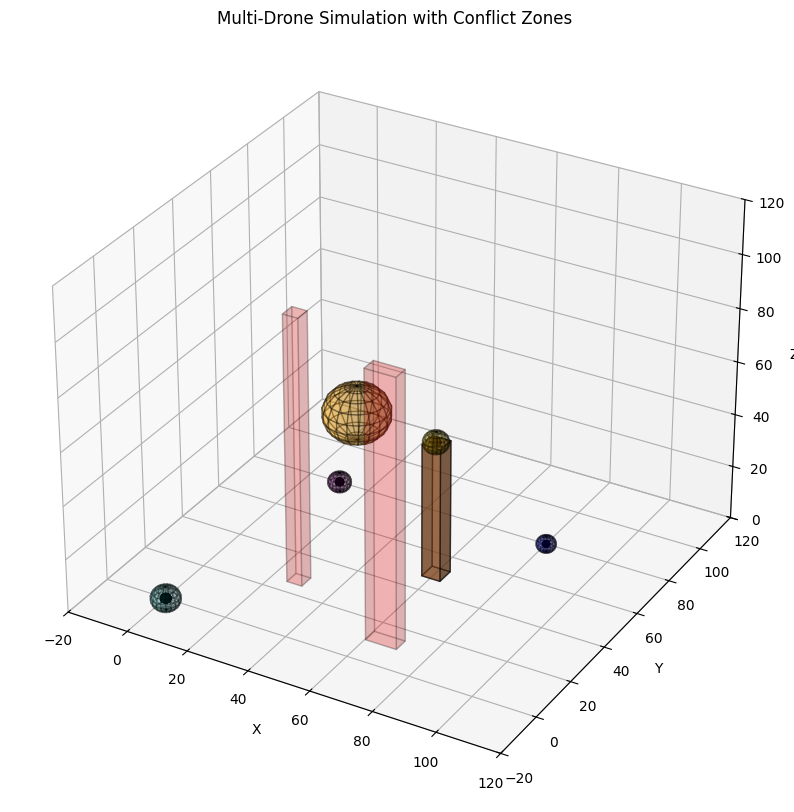

In [ ]:
# === Visualisation and animation===
def draw_sphere(ax, x, y, z, r, color='blue', alpha=0.6):
    u, v = np.mgrid[0:2*np.pi:20j, 0:np.pi:10j]
    ax.plot_surface(
        x + r * np.cos(u) * np.sin(v),
        y + r * np.sin(u) * np.sin(v),
        z + r * np.cos(v),
        color=color, alpha=alpha, edgecolor='k'
    )

def draw_cuboid(ax, xmin, xmax, ymin, ymax, zmin, zmax, color='red', alpha=0.2):
    for x in [xmin, xmax]:
        ax.plot_surface(np.array([[x, x], [x, x]]),
                        np.array([[ymin, ymax], [ymin, ymax]]),
                        np.array([[zmin, zmin], [zmax, zmax]]),
                        color=color, alpha=alpha, edgecolor='k')
    for y in [ymin, ymax]:
        ax.plot_surface(np.array([[xmin, xmax], [xmin, xmax]]),
                        np.array([[y, y], [y, y]]),
                        np.array([[zmin, zmin], [zmax, zmax]]),
                        color=color, alpha=alpha, edgecolor='k')
    for z in [zmin, zmax]:
        ax.plot_surface(np.array([[xmin, xmax], [xmin, xmax]]),
                        np.array([[ymin, ymin], [ymax, ymax]]),
                        np.array([[z, z], [z, z]]),
                        color=color, alpha=alpha, edgecolor='k')

def update(frame):
    ax.cla()
    ax.set_title("Multi-Drone Simulation with Conflict Zones", fontsize=12)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.set_xlim([-20, 120])
    ax.set_ylim([-20, 120])
    ax.set_zlim([0, 120])

    # Draw static conflict zones
    for nfz in no_fly_zones:
        draw_cuboid(ax, nfz['xmin'], nfz['xmax'], nfz['ymin'], nfz['ymax'], nfz['zmin'], nfz['zmax'], color='red', alpha=0.15)
    for ox, oy, oz, r, _ in obstacles:
        draw_sphere(ax, ox, oy, oz, r, color='orange', alpha=0.3)
    for bx, by, height, radius, name in buildings:
        draw_cuboid(ax, bx - radius, bx + radius, by - radius, by + radius, 0, height, color='saddlebrown', alpha=0.5)

    # Draw warning markers at conflict locations with subscripted numbers
    for idx, (xc, yc, zc) in enumerate(conflict_points):
        ax.text(xc, yc, zc + 2, f'⚠️{idx+1}', color='blue', fontsize=12)

    # Draw primary drone
    path_so_far = np.array(path[:frame+1])
    ax.plot(path_so_far[:, 0], path_so_far[:, 1], path_so_far[:, 2], color=primary_drone_color, linewidth=2)
    x, y, z, _ = path[frame]
    draw_sphere(ax, x, y, z, Safety_radius, color=primary_drone_color, alpha=0.2)
    draw_sphere(ax, x, y, z, drone_radius, color=primary_drone_color, alpha=0.8)

    # Draw simulated drones
    for drone in simulated_drones:
        sp = sim_paths[drone.drone_id]
        if frame < len(sp):
            trail = np.array(sp[:frame+1])
            curr = sp[frame]
        else:
            trail = np.array(sp)
            curr = sp[-1]

        ax.plot(trail[:, 0], trail[:, 1], trail[:, 2], linestyle='--', color=drone.color, linewidth=1)
        xd, yd, zd, _ = curr

        # Check if this drone is in conflict now
        conflict_now = any(
            c["type"] == "Drone Conflict" and drone.drone_id == c.get("with") and abs(c["time"] - trail[-1][3]) < 1
            for c in conflict_result["conflicts"]
        )

        if conflict_now:
            draw_sphere(ax, xd, yd, zd, drone.safety_radius, color='red', alpha=0.5)
        else:
            draw_sphere(ax, xd, yd, zd, drone.safety_radius, color=drone.color, alpha=0.2)
        draw_sphere(ax, xd, yd, zd, drone.radius, color=drone.color, alpha=0.9)

    # Clear previous bottom text
    for txt in fig.texts:
        txt.set_visible(False)

    # === Always show full conflict list below plot ===
    if conflict_result["conflicts"]:
        text_block = ""
        for i, c in enumerate(conflict_result["conflicts"]):
            drone_name = c.get("with", "Primary")
            t = c.get("time", -1)
            text_block += f"⚠️{i+1}: {c['type']} at t={t:.1f}s with {drone_name}\n"
        fig.text(0.05, 0.01, text_block.strip(), fontsize=8, color='darkred', ha='left')

    return []


# === Create and Display Animation ===
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ani = animation.FuncAnimation(fig, update, frames=len(path), interval=frame_interval, blit=False)

from IPython.display import HTML
HTML(ani.to_jshtml())
